In [2]:
using MDToolbox
using Plots

nmodel = 50

50

In [3]:
function make_merged_T(ids, T, p, nmodel)
    ret_T = zeros(nmodel, nmodel)
    ret_p = zeros(nmodel)
    for i in 1:length(ids)
        i_state = ids[i][1]
        for j in 1:length(ids)
            j_state = ids[j][1]
            ret_T[i_state, j_state] += T[i, j]
        end

        ret_p[i_state] += p[i]
    end

    for i in 1:nmodel
        if sum(ret_T[i, :]) <= 1e-100
            continue 
        end
        ret_T[i, :] ./= sum(ret_T[i, :])
    end

    return ret_T, ret_p
end

make_merged_T (generic function with 1 method)

In [4]:
using BSON: @save, @load
@load "arg_id_10_baumwelch.bson" true_T true_pi_i T learned_T learned_pi_i obs_list log_emission ids nid

In [5]:
t, p = make_merged_T(ids, learned_T, learned_pi_i, nmodel)

([0.10868901551807879 0.040930061963869765 … 0.041274429718588655 0.05496780923257125; 0.005260391367760091 0.0759015337926632 … 0.03417258994339447 0.03685539392282366; … ; 0.006344796004192775 0.020600645360785003 … 0.056307838381398856 0.060860398936641774; 0.010864368448714877 0.019196877813630542 … 0.053213908701032285 0.09042981178389443], [0.00478799610161943, 0.013637561114099023, 0.1561062623288448, 0.0007267601828887732, 0.026147254337271473, 0.001244038323893893, 0.0066679121632386325, 0.00581736832588558, 0.009735010887140889, 0.02074819516959875  …  0.029322949402551507, 0.0018430841669241763, 0.011769198818663415, 0.009330637140827705, 0.0014908972392077132, 0.048020632799512665, 0.0023793444366971912, 0.010086870644189868, 0.02025407075103585, 0.021137752693745])

In [6]:
Ts = []
Ps = []

nsample = 25

for i = 1:nsample
    @load "arg_id_$(i)_baumwelch.bson" true_T true_pi_i T learned_T learned_pi_i obs_list log_emission ids nid
    t, p = make_merged_T(ids, learned_T, learned_pi_i, nmodel)
    push!(Ts, t)
    push!(Ps, p)
end

In [7]:
@load "../../data/t1r/t1r.bson" T pi_i centroid
#r = BSON.load("../data/t1r/t1r.bson"
true_T = deepcopy(T)
true_pi_i = deepcopy(pi_i);

In [8]:
pp = msmplot(true_T, pi_i=true_pi_i, x=centroid[:, 1], y=centroid[:, 2], 
            nodesize=1.2, edgewidth_scale=8.0, arrow_scale=0.001, 
            dpi=300)

In [9]:
pp = msmplot(Ts[1], pi_i=Ps[1], x=centroid[:, 1], y=centroid[:, 2], 
            nodesize=1.2, edgewidth_scale=8.0, arrow_scale=0.001, 
            dpi=300)

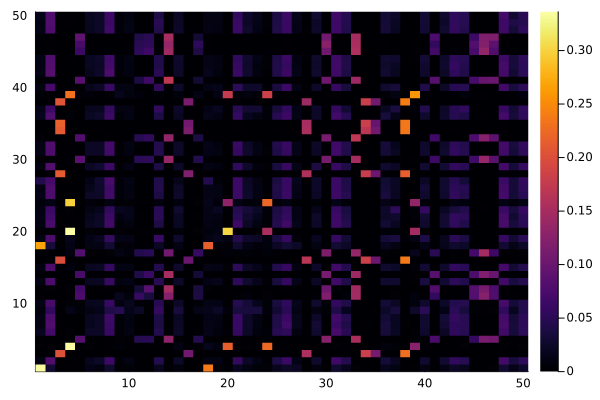

In [10]:
heatmap(true_T)

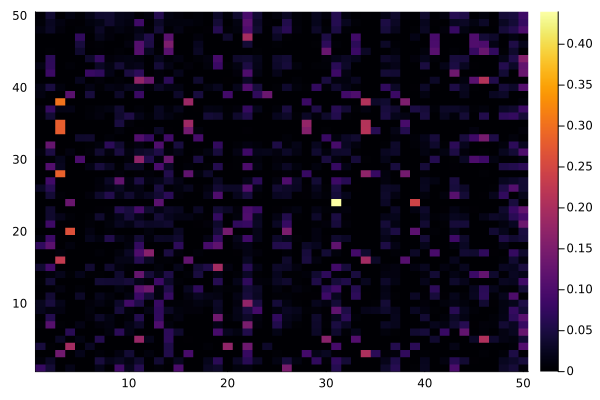

In [11]:
heatmap(Ts[1])

In [33]:
ii = round.(Int, collect(range(3, stop=46, length=5)))

r = Matrix{Float64}(undef, nsample, 5*5)
r_true = Matrix{Float64}(undef, 1, 5*5)
icount = 0
for i in ii
    for j in ii
        icount += 1
        r_true[1, icount] = true_T[i, j]
        for isample = 1:nsample
            r[isample, icount] = Ts[isample][i, j]
        end
    end
end

In [39]:
ii

5-element Vector{Int64}:
  3
 14
 24
 35
 46

In [35]:
histogram(r, bins=range(0, stop=1,length=100), label=nothing, layout = 25, xlims=(-0.1, 1.1), framestyle=:box, size=(1100, 550), dpi=300)
histogram!(r_true, bins=range(0, stop=1,length=30), label=nothing, layout = 25, xlims=(-0.1, 1.1), lims=(-0.1, 4.0), framestyle=:box, size=(1100, 550), dpi=300, color=:red)

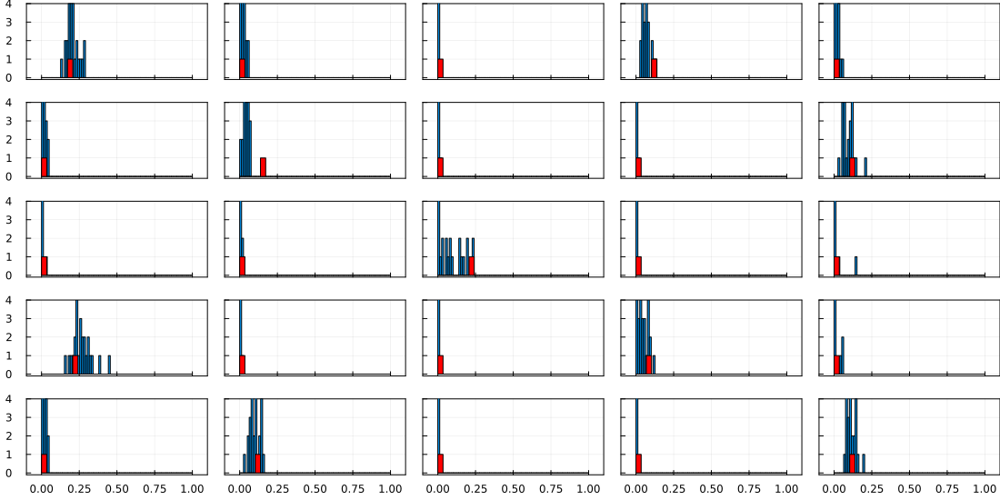

In [51]:
histogram(r, bins=range(0, stop=1,length=80), label=nothing, layout = 25, xlims=(-0.1, 1.1), framestyle=:box, size=(1100, 550), dpi=300)
pp = histogram!(r_true, bins=range(0, stop=1,length=30), label=nothing, layout = 25, xlims=(-0.1, 1.1), lims=(-0.1, 4.0), framestyle=:box, size=(1100, 550), dpi=300, color=:red, link=:both, 
    right_margin=Plots.Measures.Length(:mm, -3), left_margin=Plots.Measures.Length(:mm, 0),
    top_margin=Plots.Measures.Length(:mm, -1))

for i=1:20
    plot!(pp[i],xformatter=_->"")
end

for i = 0:24
    if mod(i, 5) != 0
        plot!(pp[i+1],yformatter=_->"")
    end
end

pp

In [53]:
savefig(pp, "plot.png")

"/data/yasu/seica/01_psudo_test/04_confidence_interval_radius_20/plot.png"